In [37]:
%reload_ext autoreload
%autoreload 2
from matplotlib import pyplot as plt


In [3]:
from postprocessing.euclidean_distance import L2

In [4]:
model_name = 'seresnext101'
fold = 2
checkpoint = '20600'
algo = 'dist_global_org'
dist = L2(model_name, fold, checkpoint)

In [6]:
dist.querytopnclosest(20)

In [13]:
from postprocessing.postprocessing import Post_Pipeline

In [14]:
model_name = 'seresnext101'
fold = 2
checkpoint = '20600'
algo = 'dist_global_org'
pip = Post_Pipeline(model_name, fold, checkpoint, algo, dist.test)

In [66]:
def get_img_ratio(x):
    img = plt.imread(fp+x)
    return img.shape[0]/img.shape[1]

def get_img_res(x):
    img = plt.imread(fp+x)
    return img.shape[0] * img.shape[1]

In [67]:
clean_pred = pd.DataFrame([dist.test[0],
                           dist.test[0].map(lambda x: get_img_ratio(x)), 
                           dist.test[0].map(lambda x: get_img_res(x))])

In [69]:
clean_pred = clean_pred.T

In [75]:
clean_pred.columns = ['img', 'ratio', 'res']

In [106]:
clean_pred.sort_values('ratio', ascending=False).head(50)

,img,ratio,res
196,PM-WWA-20180708-055.jpg,1.53684,499320
258,PM-WWA-20170622-486.jpg,1.42222,414720
602,PM-WWA-20180807-427.jpg,1.25217,596160
612,PM-WWA-20180522-081.jpg,1.2069,146160
562,PM-WWA-20180613-016.jpg,1.16216,916416
182,PM-WWA-20170623-736.jpg,1.1519,258804
543,PM-WWA-20180804-825.jpg,1.14201,1174212
349,PM-WWA-20170921-336.jpg,1.14035,133380
299,PM-WWA-20170524-006.jpg,1.13194,844992
649,PM-WWA-20170622-205.jpg,1.11364,77616


In [85]:
clean_pred.sort_values('res').head(10)

,img,ratio,res
480,PM-WWA-20180509-211.jpg,0.761905,48384
706,PM-WWA-20180610-164.jpg,0.571429,49392
801,PM-WWA-20170622-214.jpg,0.878049,53136
789,PM-WWA-20180914-066.jpg,0.883721,58824
352,PM-WWA-20180819-230.jpg,0.693878,59976
307,PM-WWA-20170622-412.jpg,0.666667,62424
797,PM-WWA-20180509-210.jpg,0.787234,62604
790,PM-WWA-20180715-437.jpg,0.589286,66528
621,PM-WWA-20170715-348.jpg,0.586207,70992
788,PM-WWA-20180913-312.jpg,0.823529,77112


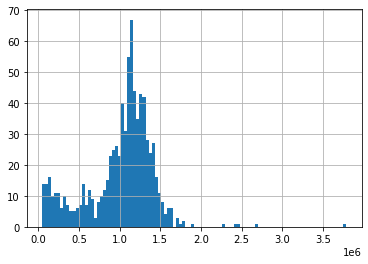

In [81]:
clean_pred.res.hist(bins=100);

In [108]:
dist.img_dist_class['img'][1].value_counts().head(20)

PM-WWA-20180902-108.jpg    10
PM-WWA-20170709-200.jpg     8
PM-WWA-20170801-051.jpg     5
PM-WWA-20170707-335.jpg     4
PM-WWA-20180506-365.jpg     4
PM-WWA-20180807-427.jpg     4
PM-WWA-20180710-127.jpg     4
PM-WWA-20180622-363.jpg     3
PM-WWA-20180627-163.jpg     3
PM-WWA-20160805-151.jpg     3
PM-WWA-20170815-056.jpg     3
PM-WWA-20180806-054.jpg     3
PM-WWA-20180806-067.jpg     3
PM-WWA-20110615-095.jpg     3
PM-WWA-20170921-183.jpg     3
PM-WWA-20180622-383.jpg     3
PM-WWA-20180813-273.jpg     2
PM-WWA-20060615-038.jpg     2
PM-WWA-20170629-073.jpg     2
PM-WWA-20100909-005.jpg     2
Name: 1, dtype: int64

In [113]:
dist.test[dist.test[1]=='PM-WWA-20170709-200.jpg']

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
208,PM-WWA-20180714-016.jpg,PM-WWA-20170709-200.jpg,PM-WWA-20180622-383.jpg,PM-WWA-20170414-363.jpg,PM-WWA-20180522-176.jpg,PM-WWA-20180622-347.jpg,PM-WWA-20180710-127.jpg,PM-WWA-20170921-183.jpg,PM-WWA-20180806-054.jpg,PM-WWA-20170921-119.jpg,...,PM-WWA-20180713-160.jpg,PM-WWA-20170815-056.jpg,PM-WWA-20180713-082.jpg,PM-WWA-20180729-012.jpg,PM-WWA-20180522-074.jpg,PM-WWA-20170707-335.jpg,PM-WWA-20180913-312.jpg,PM-WWA-20170707-432.jpg,PM-WWA-20180902-108.jpg,PM-WWA-20170528-016.jpg
333,PM-WWA-20170921-183.jpg,PM-WWA-20170709-200.jpg,PM-WWA-20180902-108.jpg,PM-WWA-20180729-012.jpg,PM-WWA-20170414-363.jpg,PM-WWA-20180622-383.jpg,PM-WWA-20180522-074.jpg,PM-WWA-20180506-399.jpg,PM-WWA-20170921-119.jpg,PM-WWA-20180714-016.jpg,...,PM-WWA-20180622-347.jpg,PM-WWA-20180713-160.jpg,PM-WWA-20170629-073.jpg,PM-WWA-20170815-056.jpg,PM-WWA-20180813-273.jpg,PM-WWA-20170710-004.jpg,PM-WWA-20180807-427.jpg,PM-WWA-20180904-089.jpg,PM-WWA-20170707-432.jpg,PM-WWA-20180713-082.jpg
513,PM-WWA-20170414-363.jpg,PM-WWA-20170709-200.jpg,PM-WWA-20180902-108.jpg,PM-WWA-20170815-056.jpg,PM-WWA-20180714-016.jpg,PM-WWA-20170921-183.jpg,PM-WWA-20180522-074.jpg,PM-WWA-20180904-089.jpg,PM-WWA-20170707-432.jpg,PM-WWA-20170710-004.jpg,...,PM-WWA-20180806-054.jpg,PM-WWA-20180729-012.jpg,PM-WWA-20170921-119.jpg,PM-WWA-20180506-399.jpg,PM-WWA-20180813-273.jpg,PM-WWA-20180622-383.jpg,PM-WWA-20180807-427.jpg,PM-WWA-20180522-176.jpg,PM-WWA-20180913-312.jpg,PM-WWA-20180804-747.jpg
550,PM-WWA-20170815-056.jpg,PM-WWA-20170709-200.jpg,PM-WWA-20180902-108.jpg,PM-WWA-20170414-363.jpg,PM-WWA-20170921-119.jpg,PM-WWA-20180714-016.jpg,PM-WWA-20170921-183.jpg,PM-WWA-20170710-004.jpg,PM-WWA-20180813-273.jpg,PM-WWA-20170629-073.jpg,...,PM-WWA-20180522-176.jpg,PM-WWA-20180806-054.jpg,PM-WWA-20170707-432.jpg,PM-WWA-20180622-383.jpg,PM-WWA-20180904-089.jpg,PM-WWA-20180713-160.jpg,PM-WWA-20180729-012.jpg,PM-WWA-20180506-399.jpg,PM-WWA-20180622-347.jpg,PM-WWA-20180522-074.jpg
641,PM-WWA-20180902-108.jpg,PM-WWA-20170709-200.jpg,PM-WWA-20170815-056.jpg,PM-WWA-20170414-363.jpg,PM-WWA-20170921-183.jpg,PM-WWA-20170921-119.jpg,PM-WWA-20170629-073.jpg,PM-WWA-20170707-432.jpg,PM-WWA-20180522-074.jpg,PM-WWA-20170710-004.jpg,...,PM-WWA-20180813-273.jpg,PM-WWA-20180506-399.jpg,PM-WWA-20180729-012.jpg,PM-WWA-20180622-383.jpg,PM-WWA-20180807-427.jpg,PM-WWA-20180913-312.jpg,PM-WWA-20180804-747.jpg,PM-WWA-20180714-016.jpg,PM-WWA-20180904-089.jpg,PM-WWA-20170724-108.jpg
701,PM-WWA-20180713-160.jpg,PM-WWA-20170709-200.jpg,PM-WWA-20170921-183.jpg,PM-WWA-20180714-016.jpg,PM-WWA-20180813-273.jpg,PM-WWA-20180622-383.jpg,PM-WWA-20170414-363.jpg,PM-WWA-20180522-176.jpg,PM-WWA-20180904-089.jpg,PM-WWA-20180522-074.jpg,...,PM-WWA-20170629-073.jpg,PM-WWA-20180622-347.jpg,PM-WWA-20180913-312.jpg,PM-WWA-20180713-082.jpg,PM-WWA-20170707-432.jpg,PM-WWA-20170921-119.jpg,PM-WWA-20180902-108.jpg,PM-WWA-20180806-054.jpg,PM-WWA-20180710-127.jpg,PM-WWA-20180506-399.jpg
790,PM-WWA-20180715-437.jpg,PM-WWA-20170709-200.jpg,PM-WWA-20180902-108.jpg,PM-WWA-20170528-016.jpg,PM-WWA-20180522-176.jpg,PM-WWA-20170815-056.jpg,PM-WWA-20170414-363.jpg,PM-WWA-20180913-312.jpg,PM-WWA-20170921-183.jpg,PM-WWA-20170629-073.jpg,...,PM-WWA-20180622-347.jpg,PM-WWA-20170707-432.jpg,PM-WWA-20180813-273.jpg,PM-WWA-20180807-427.jpg,PM-WWA-20180522-074.jpg,PM-WWA-20180622-383.jpg,PM-WWA-20180714-016.jpg,PM-WWA-20181019-254.jpg,PM-WWA-20180729-012.jpg,PM-WWA-20170724-108.jpg


In [119]:
dist.img_dist_class['dist']

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.996652,1.459022,1.474350,1.526761,1.528849,1.535721,1.556890,1.571648,1.571838,1.572906,1.575647,1.579885,1.580068,1.586380,1.586477,1.586829,1.587883,1.592161,1.599438,1.601198
1,1.287072,1.353794,1.426428,1.443597,1.449870,1.454277,1.483820,1.509563,1.512745,1.513618,1.520821,1.524487,1.524716,1.527382,1.529324,1.530079,1.531354,1.532708,1.537441,1.539414
2,0.800068,1.394787,1.410857,1.430889,1.548201,1.581787,1.588441,1.596939,1.617126,1.617320,1.619054,1.621602,1.623787,1.628139,1.632574,1.633448,1.635101,1.635193,1.635713,1.635937
3,1.285229,1.362487,1.371526,1.397687,1.418443,1.451744,1.452411,1.468943,1.471760,1.494329,1.496775,1.507313,1.509754,1.512052,1.513318,1.515223,1.515826,1.516231,1.520190,1.520718
4,1.454526,1.471994,1.491842,1.495445,1.498319,1.498793,1.504488,1.507623,1.508870,1.509575,1.513910,1.520380,1.525743,1.525822,1.528482,1.542459,1.546228,1.546252,1.549478,1.550146
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
803,1.461342,1.466271,1.467200,1.471391,1.471777,1.473068,1.478557,1.482719,1.482971,1.494064,1.494506,1.496493,1.498914,1.499120,1.506254,1.517454,1.518110,1.518986,1.534027,1.544686
804,0.716098,0.732463,0.735829,0.798897,0.813592,0.845248,0.858890,0.869822,0.904529,0.910475,0.914216,0.917279,0.927829,0.950431,0.957256,0.958923,0.966801,0.968439,0.969159,0.970317
805,0.743483,0.873182,0.965901,1.071032,1.394437,1.406965,1.412982,1.417035,1.425862,1.449473,1.452536,1.452808,1.456752,1.460229,1.475453,1.488537,1.491015,1.491647,1.499139,1.503913
806,0.186792,0.302628,0.377897,0.614311,0.929180,1.453521,1.461057,1.467968,1.469593,1.501449,1.505792,1.515156,1.526194,1.533722,1.537463,1.554705,1.555905,1.556591,1.560034,1.566052


In [120]:
dist.test.loc[806]

0      PM-WWA-20180713-173.jpg
1      PM-WWA-20160705-107.jpg
2      PM-WWA-20110615-009.jpg
3     PM-WWA-201006018-016.jpg
4      PM-WWA-20140608-153.jpg
5      PM-WWA-20090712-020.jpg
6      PM-WWA-20090426-033.jpg
7      PM-WWA-20090704-126.jpg
8      PM-WWA-20110811-079.jpg
9      PM-WWA-20180806-015.jpg
10    PM-WWA-201006027-009.jpg
11     PM-WWA-20080527-077.jpg
12     PM-WWA-20080426-184.jpg
13     PM-WWA-20080615-159.jpg
14     PM-WWA-20080727-097.jpg
15     PM-WWA-20070513-099.jpg
16     PM-WWA-20170727-157.jpg
17     PM-WWA-20180913-327.jpg
18     PM-WWA-20110823-045.jpg
19     PM-WWA-20080824-084.jpg
20     PM-WWA-20060731-072.jpg
Name: 806, dtype: object

In [118]:
dist.img_dist_class['dist'].loc[641]

0     0.375638
1     0.394934
2     0.440496
3     0.477608
4     0.483534
5     0.494199
6     0.513547
7     0.533365
8     0.537535
9     0.538623
10    0.540301
11    0.545753
12    0.549727
13    0.553873
14    0.560863
15    0.564098
16    0.597924
17    0.599408
18    0.600376
19    0.608544
Name: 641, dtype: float32

In [46]:
dist.img_dist_class['img'][0].value_counts().head(20)

PM-WWA-20170709-200.jpg     7
PM-WWA-20180806-054.jpg     6
PM-WWA-20170707-335.jpg     5
PM-WWA-20180902-108.jpg     5
PM-WWA-20180522-074.jpg     4
PM-WWA-20170921-183.jpg     4
PM-WWA-20170720-174.jpg     3
PM-WWA-20180813-273.jpg     3
PM-WWA-20180714-016.jpg     3
PM-WWA-20170622-214.jpg     3
PM-WWA-20180914-022.jpg     3
PM-WWA-20170829-446.jpg     3
PM-WWA-20180710-127.jpg     3
PM-WWA-20170714-046.jpg     3
PM-WWA-20170801-061.jpg     3
PM-WWA-20070513-093.jpg     3
PM-WWA-20180601-077.jpg     3
PM-WWA-20180709-049.jpg     3
PM-WWA-20180610-180.jpg     2
PM-WWA-201006018-046.jpg    2
Name: 0, dtype: int64

In [52]:
plt.imread(fp+'PM-WWA-20170801-061.jpg').shape

(758, 1700, 3)

In [ ]:
img = plt.imread(fp+'PM-WWA-20180610-180.jpg')
img.shape[0]/img.shape[1]

In [101]:
img = plt.imread(fp+'PM-WWA-20170923-018.jpg')
img.shape[0]/img.shape[1]

0.8712121212121212

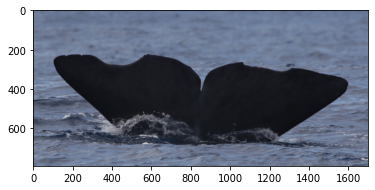

In [122]:
fp = '/home/pt-support/Humpback-Whale-Identification-1st-/WC_input/data/'
plt.imshow(plt.imread(fp+'PM-WWA-20160705-107.jpg'));


In [126]:
a = pip.imgs_id_matched[['0_x', '0_y']]

b = pip.imgs_id_matched[['0_y', '0_x']]

a.columns = ['x', 'y']
b.columns = ['x', 'y']

pairs = a.drop(3).append(b.drop(3)).reset_index(drop=True)

In [141]:
dist.img_dist_class['class'].loc[dist.test[dist.test[0].isin(pairs.x)].index][0].notnull()

38     False
48      True
75     False
78     False
102    False
115    False
123    False
197    False
248     True
261    False
278    False
293     True
349    False
364    False
373    False
404    False
411    False
466    False
474    False
475    False
480     True
501    False
512    False
545    False
571    False
608    False
613    False
619    False
634    False
650    False
653    False
665    False
733    False
745    False
766    False
797    False
Name: 0, dtype: bool

In [142]:
dist.img_dist_class['dist'].loc[dist.test[dist.test[0].isin(pairs.x)].index][0].loc[dist.img_dist_class['class'].loc[dist.test[dist.test[0].isin(pairs.x)].index][0].notnull()]

48     1.186404
248    1.432515
293    1.510626
480    1.419223
Name: 0, dtype: float32

In [ ]:
f1 = pip.imgs_id_matched.loc[i, '0_x']
f2 = pip.imgs_id_matched.loc[i, '0_y']

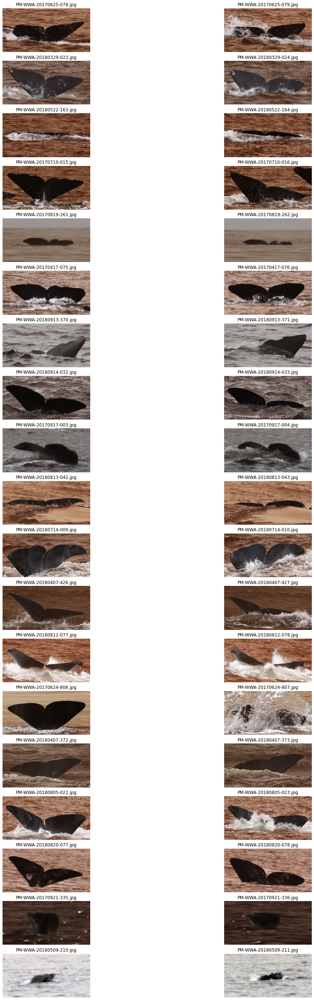

In [90]:
pip.view_matched_images()

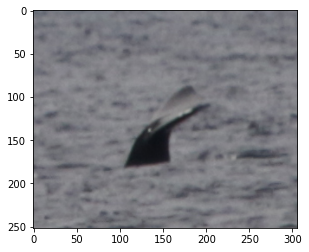

In [87]:
fp = '/home/pt-support/Humpback-Whale-Identification-1st-/WC_input/data/'
plt.imshow(plt.imread(fp+'PM-WWA-20180913-312.jpg'));

In [50]:
plt.imread(fp+'PM-WWA-20180902-108.jpg').shape

(294, 270, 3)

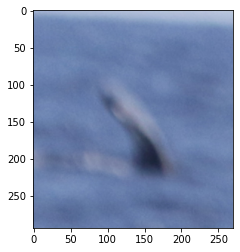

In [44]:
fp = '/home/pt-support/Humpback-Whale-Identification-1st-/WC_input/data/'
plt.imshow(plt.imread(fp+'PM-WWA-20180902-108.jpg'));

In [55]:
img = plt.imread(fp+'PM-WWA-20170707-335.jpg')
img.shape[0]/img.shape[1]

0.81

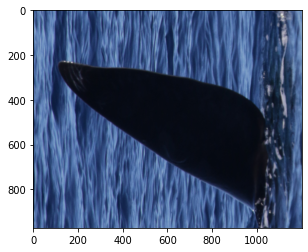

In [43]:
fp = '/home/pt-support/Humpback-Whale-Identification-1st-/WC_input/data/'
plt.imshow(plt.imread(fp+'PM-WWA-20170707-335.jpg'));

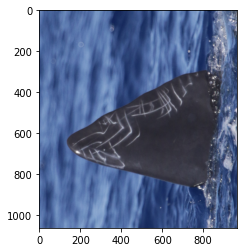

In [42]:
fp = '/home/pt-support/Humpback-Whale-Identification-1st-/WC_input/data/'
plt.imshow(plt.imread(fp+'PM-WWA-20180806-054.jpg'));

In [49]:
plt.imread(fp+'PM-WWA-20170709-200.jpg').shape

(312, 330, 3)

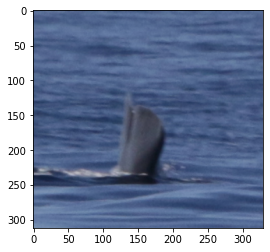

In [41]:
fp = '/home/pt-support/Humpback-Whale-Identification-1st-/WC_input/data/'
plt.imshow(plt.imread(fp+'PM-WWA-20170709-200.jpg'));

In [28]:
dist.img_dist_class.shape

(808, 60)

In [17]:
df1 = pip.infer_missing_from_train_set()
df2 = pip.match_images_on_fname()
df12 = pip.match_images_on_fname(df1)

In [18]:
df12.to_csv('predictions12.csv', header=None)

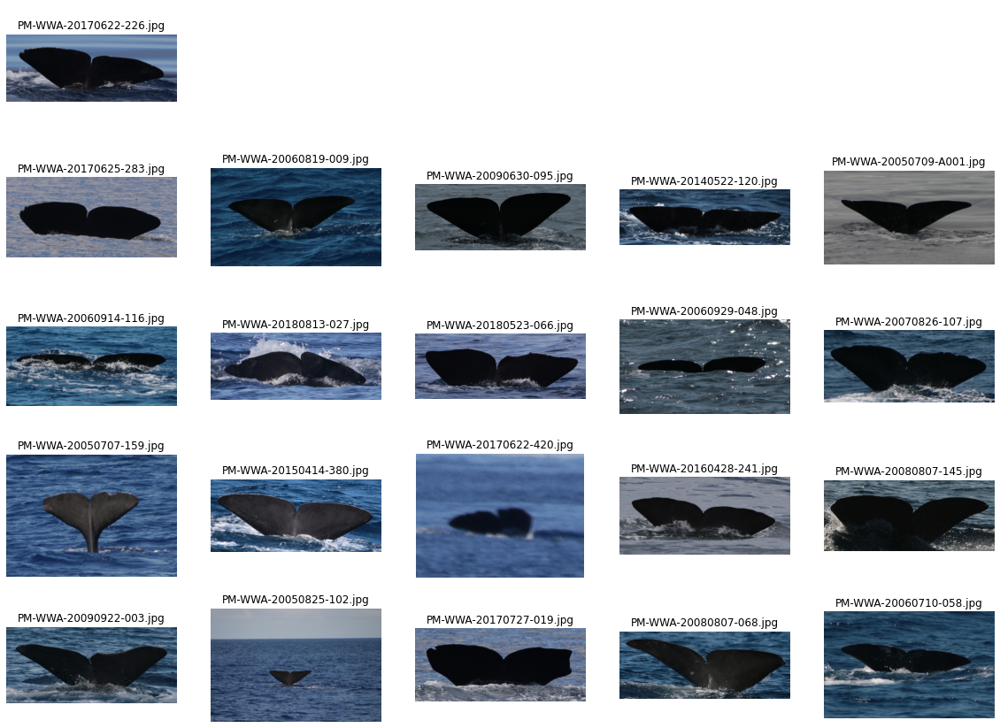

In [19]:
pip.show_top20_imgs('PM-WWA-20170622-226.jpg')

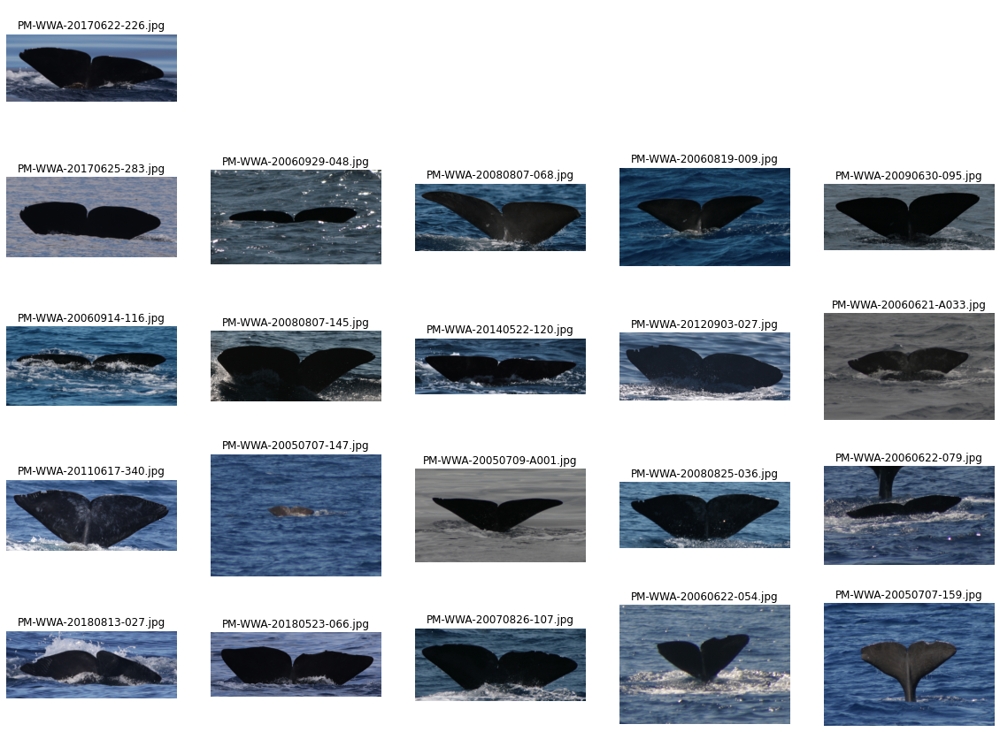

In [20]:
pip.show_top20_imgs('PM-WWA-20170622-226.jpg', df1)

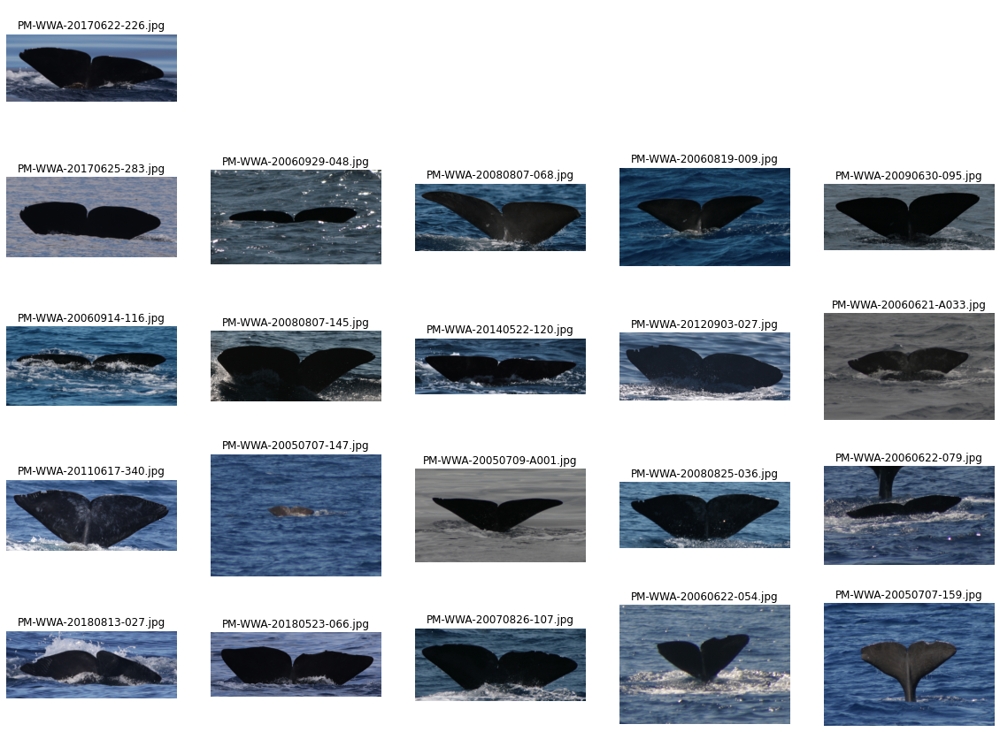

In [21]:
pip.show_top20_imgs('PM-WWA-20170622-226.jpg', df12)

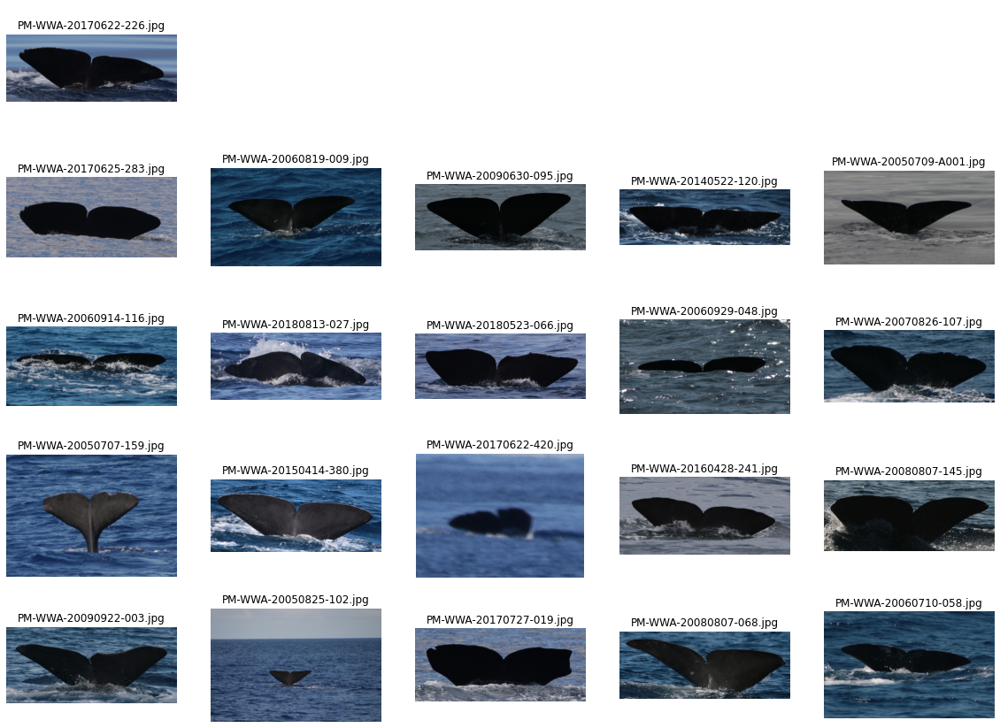

In [22]:
pip.show_top20_imgs('PM-WWA-20170622-226.jpg', df2)

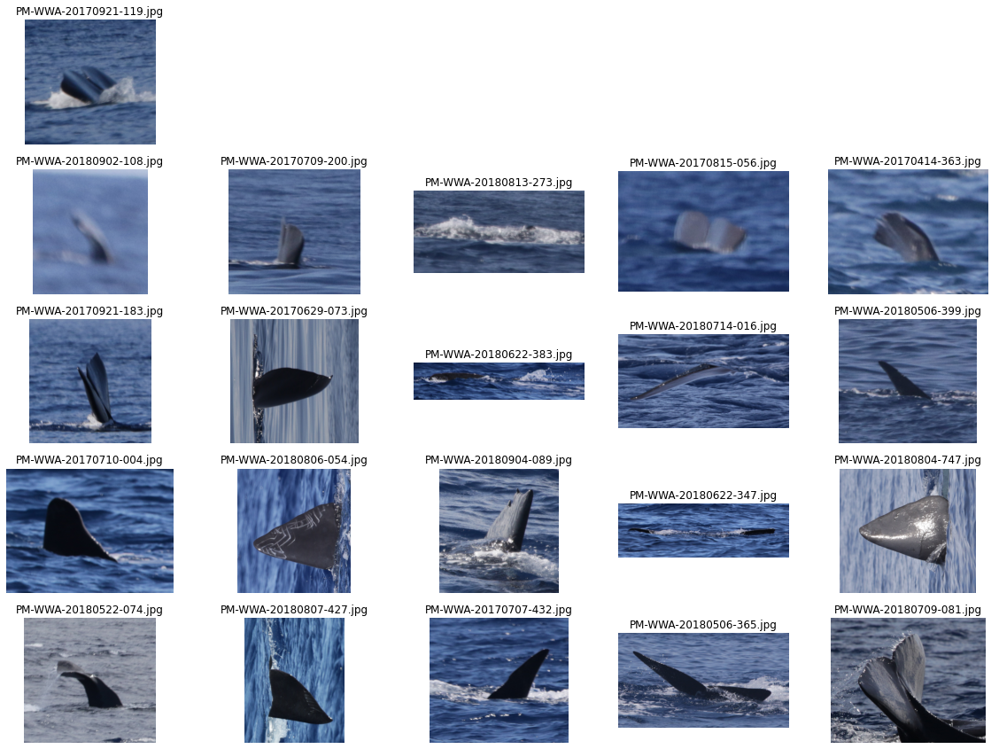

In [24]:
pip.show_top20_imgs('PM-WWA-20170921-119.jpg', df2)

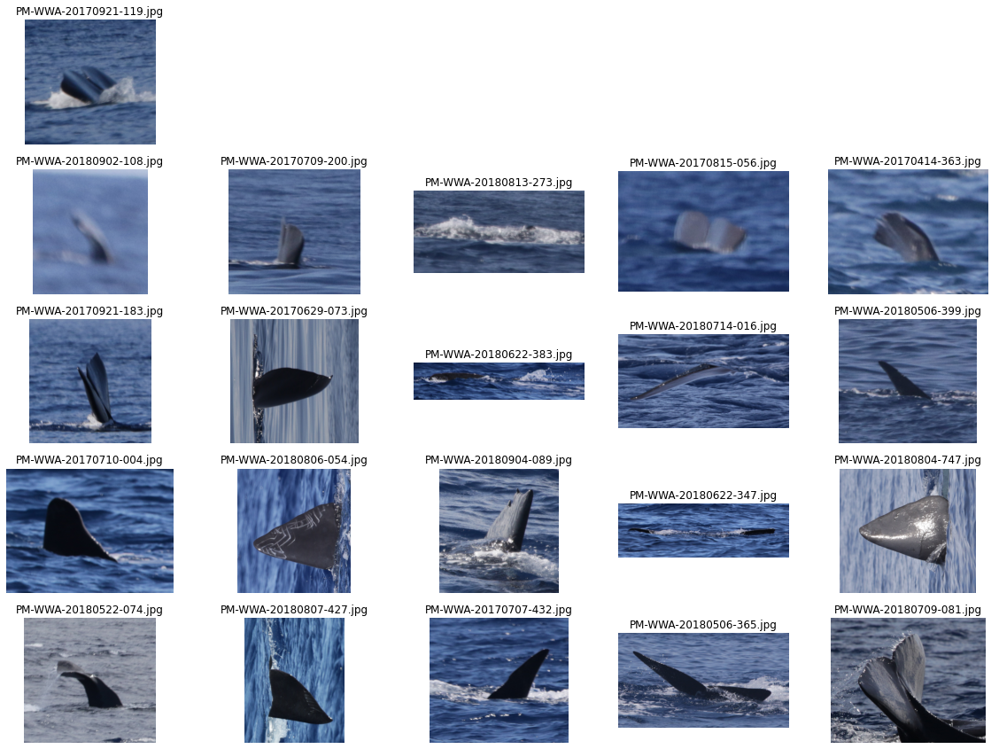

In [25]:
pip.show_top20_imgs('PM-WWA-20170921-119.jpg')

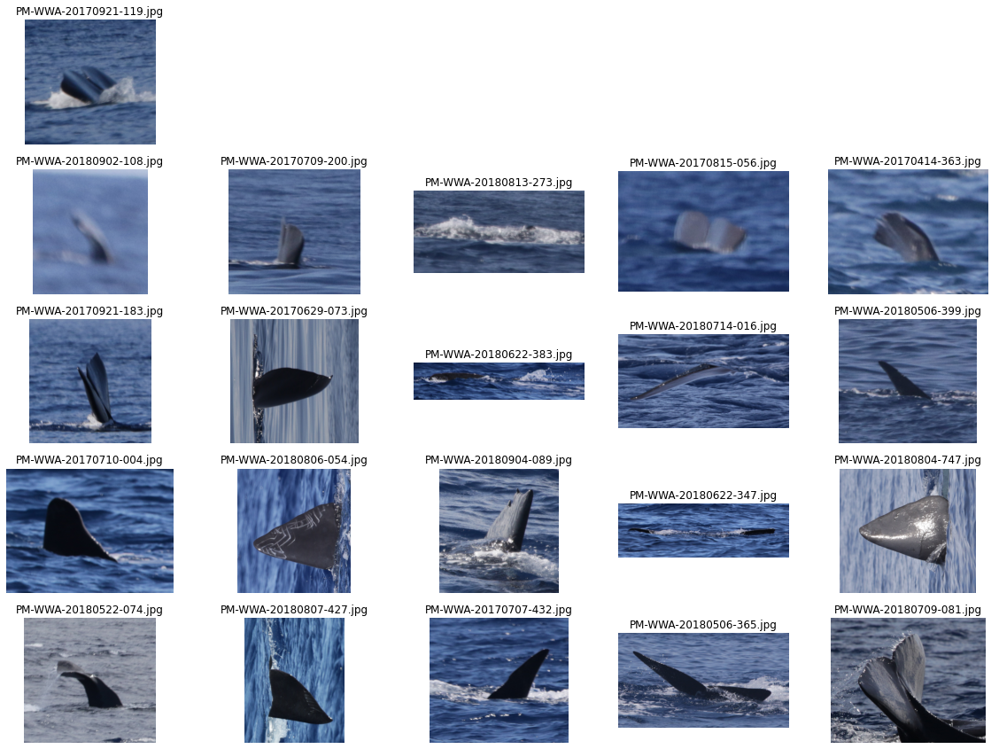

In [26]:
pip.show_top20_imgs('PM-WWA-20170921-119.jpg', df12)

In [ ]:
pip.show_top20_imgs('PM-WWA-20170921-119.jpg', df2)